## Chi dữ liệu

In [5]:
data_yaml_path = "/hdd2/minhnv/CodingYOLOv12/Dataset/Student-Behavior-Recognition-6_oversampled/data.yaml"

In [10]:
import os
import shutil
import yaml

def oversample_minority_classes(src_images_dir, src_labels_dir, dest_images_dir, dest_labels_dir, minority_classes, class_names, oversample_factor=3):
    """
    Sao chép ảnh và file label từ tập gốc sang tập mới (oversampled).
    Nếu file label chứa ít nhất 1 nhãn thuộc minority, tạo thêm (oversample_factor - 1) bản sao.
    """
    os.makedirs(dest_images_dir, exist_ok=True)
    os.makedirs(dest_labels_dir, exist_ok=True)
    
    for label_file in os.listdir(src_labels_dir):
        if not label_file.endswith('.txt'):
            continue
        
        src_label_path = os.path.join(src_labels_dir, label_file)
        with open(src_label_path, 'r') as f:
            lines = f.readlines()
        
        contains_minority = False
        # Kiểm tra xem file label có chứa nhãn nào thuộc minority không
        for line in lines:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            try:
                class_id = int(float(parts[0]))
            except Exception as e:
                continue
            if class_id < len(class_names) and class_names[class_id] in minority_classes:
                contains_minority = True
                break
        
        # Xác định file ảnh tương ứng (hỗ trợ jpg, jpeg, png)
        base_name, _ = os.path.splitext(label_file)
        src_image_path = None
        for ext in ['.jpg', '.jpeg', '.png']:
            candidate = os.path.join(src_images_dir, base_name + ext)
            if os.path.exists(candidate):
                src_image_path = candidate
                break
        if src_image_path is None:
            print(f"Không tìm thấy ảnh cho label: {label_file}")
            continue
        
        # Copy file gốc (ảnh và label) sang thư mục đích
        shutil.copy(src_image_path, os.path.join(dest_images_dir, os.path.basename(src_image_path)))
        shutil.copy(src_label_path, os.path.join(dest_labels_dir, label_file))
        
        # Nếu chứa nhãn minority, tạo thêm các bản sao
        if contains_minority:
            for i in range(oversample_factor - 1):
                new_image_name = f"{base_name}_dup{i}{os.path.splitext(src_image_path)[1]}"
                new_label_name = f"{base_name}_dup{i}.txt"
                shutil.copy(src_image_path, os.path.join(dest_images_dir, new_image_name))
                shutil.copy(src_label_path, os.path.join(dest_labels_dir, new_label_name))
                print(f"Tạo bản sao: {new_image_name}")

def oversample_all_splits(dataset_dir, dest_dataset_dir, minority_classes, oversample_factor=3):
    """
    Oversample dữ liệu cho các split: train, valid và test.
    Tập gốc vẫn được giữ nguyên, dữ liệu oversampled sẽ được copy sang dest_dataset_dir.
    """
    # Đọc danh sách tên lớp từ file data.yaml trong thư mục gốc của dataset
    data_yaml_path = os.path.join(dataset_dir, "data.yaml")
    with open(data_yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    class_names = data['names']
    
    splits = ['train', 'valid', 'test']
    for split in splits:
        print(f"Processing split: {split}")
        src_images_dir = os.path.join(dataset_dir, split, "images")
        src_labels_dir = os.path.join(dataset_dir, split, "labels")
        dest_split_dir = os.path.join(dest_dataset_dir, split)
        dest_images_dir = os.path.join(dest_split_dir, "images")
        dest_labels_dir = os.path.join(dest_split_dir, "labels")
        
        os.makedirs(dest_images_dir, exist_ok=True)
        os.makedirs(dest_labels_dir, exist_ok=True)
        
        oversample_minority_classes(src_images_dir, src_labels_dir, dest_images_dir, dest_labels_dir,
                                    minority_classes, class_names, oversample_factor)
        print(f"Finished oversampling split: {split}\n")

if __name__ == '__main__':
    # Đường dẫn dataset gốc với cấu trúc: train/, valid/, test/
    dataset_dir = "/hdd2/minhnv/CodingYOLOv12/Dataset/Student-Behavior-Recognition-6"
    
    # Đường dẫn dataset mới sau khi oversampling (sẽ tạo ra các thư mục oversampled_train, oversampled_valid, oversampled_test)
    dest_dataset_dir = dataset_dir + "_oversampled"
    
    # Các lớp cần oversample
    minority_classes = ["drinking", "raising_hand"]
    
    # Hệ số oversample (ví dụ: 3 nghĩa là mỗi ảnh chứa nhãn minority sẽ có tổng cộng 3 bản sao)
    oversample_factor = 50
    
    oversample_all_splits(dataset_dir, dest_dataset_dir, minority_classes, oversample_factor)
    print("Oversampling hoàn thành cho tất cả các split!")


Processing split: train
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup0.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup1.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup2.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup3.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup4.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup5.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup6.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup7.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc85908bc35e65bd466_dup8.jpg
Tạo bản sao: 13_30_00-13_35_00-M-0-0-0-_frame_0224_png.rf.fb396f301421cdc859

## Thống kê, visualize

1. Reading YAML file:

Classes: ['drinking', 'raising_hand', 'sleeping', 'using_computer', 'using_phone', 'writing']

2. Directory Structure:
Root path: /hdd2/minhnv/CodingYOLOv12/Dataset/Student-Behavior-Recognition-6_oversampled
Root contents:
['data.yaml', 'train', 'test', 'valid']

Sample label content:
4 0.14893617021276595 0.6798866855524079 0.045744680851063826 0.08026440037771483
3 0.11303191489361702 0.7261567516525024 0.0601063829787234 0.0821529745042493
3 0.24202127659574468 0.7516525023607177 0.07287234042553191 0.07932011331444759
3 0.4877659574468085 0.8512747875354107 0.06914893617021277 0.07176581680830972
4 0.38776595744680853 0.4169027384324835 0.04042553191489362 0.07932011331444759
3 0.7093085106382979 0.5958451369216242 0.0925531914893617 0.12653446647780925
3 0.6289893617021277 0.6303116147308782 0.07553191489361702 0.10292728989612843

3 0.7452127659574468 0.37960339943342775 0.10638297872340426 0.18271954674220964


Sample label content:
3 0.44893617021276594 0

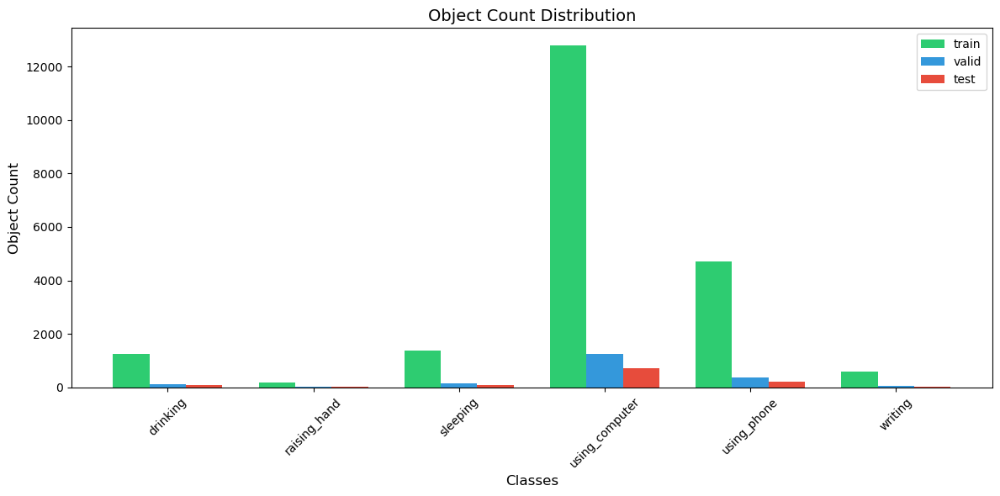


Displaying sample images:


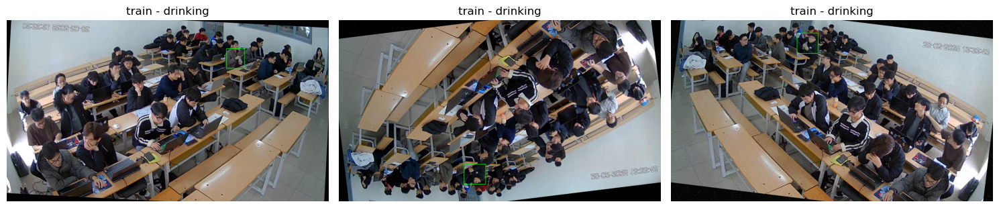

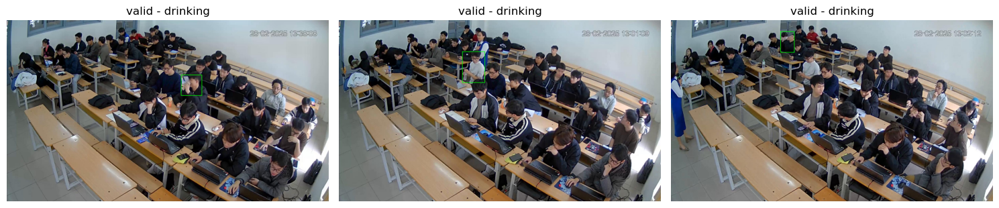

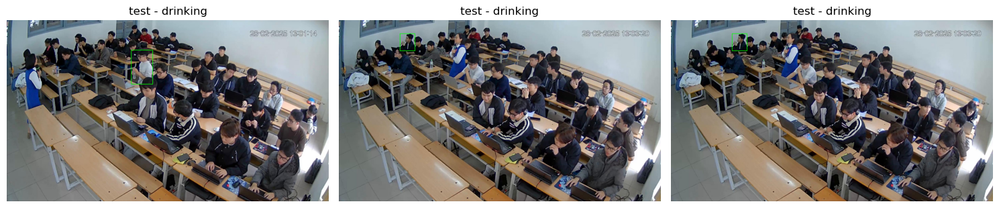

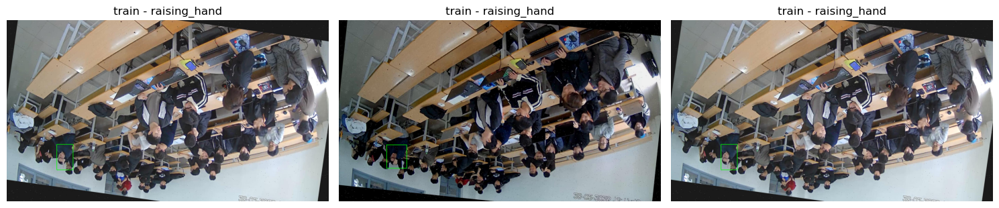

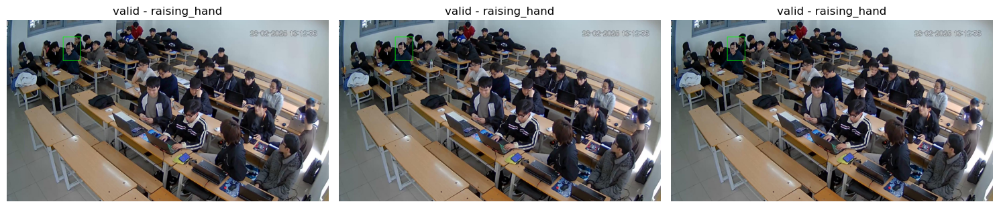

...

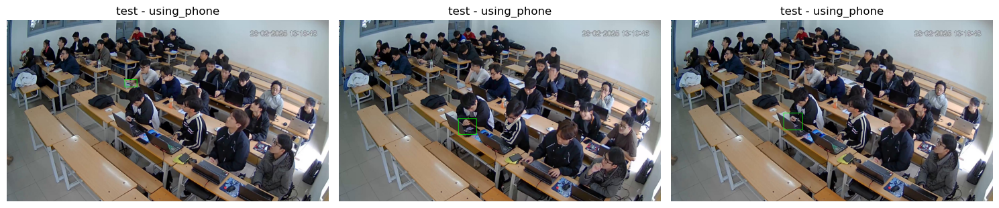

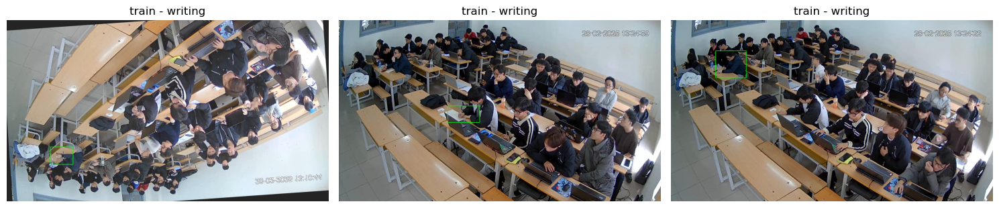

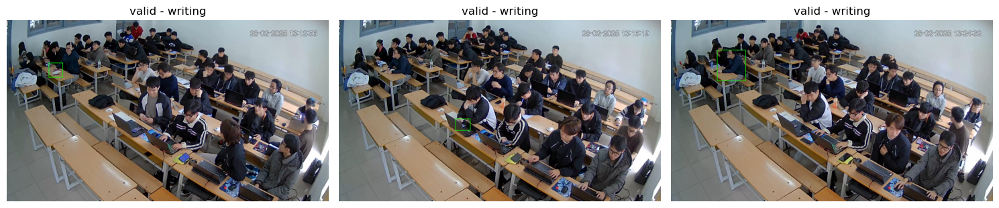

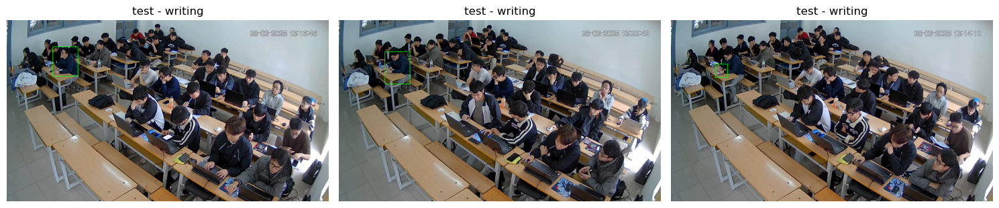

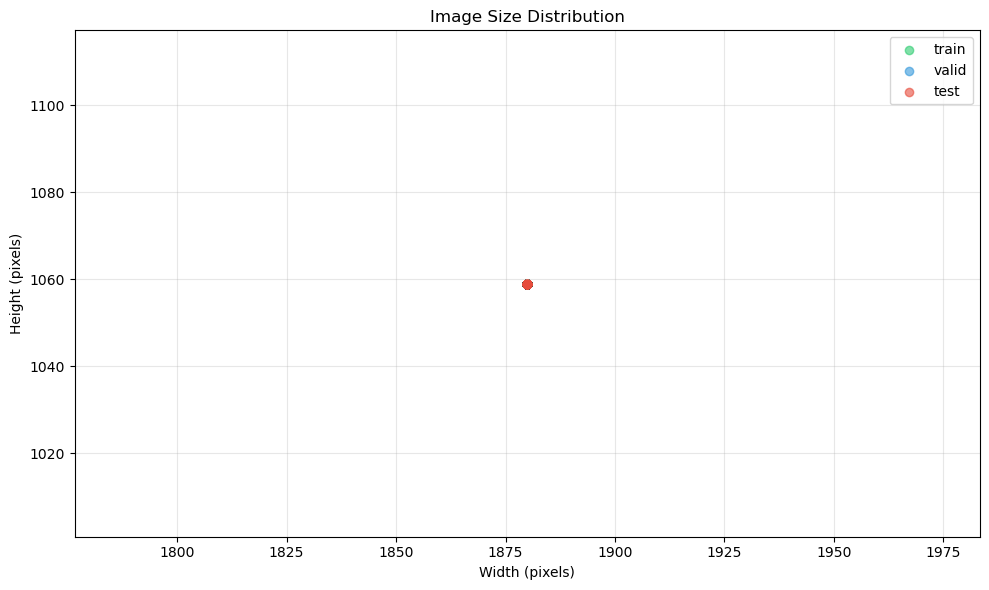


Detailed Statistics:

=== TRAIN ===

Class: using_computer
- Count: 12795
- Average Size: 1880x1059

Class: drinking
- Count: 1260
- Average Size: 1880x1059

Class: using_phone
- Count: 4727
- Average Size: 1880x1059

Class: sleeping
- Count: 1394
- Average Size: 1880x1059

Class: writing
- Count: 588
- Average Size: 1880x1059

Class: raising_hand
- Count: 192
- Average Size: 1880x1059

Total Objects: 20956

=== VALID ===

Class: using_phone
- Count: 390
- Average Size: 1880x1059

Class: sleeping
- Count: 155
- Average Size: 1880x1059

Class: drinking
- Count: 112
- Average Size: 1880x1059

Class: using_computer
- Count: 1240
- Average Size: 1880x1059

Class: writing
- Count: 69
- Average Size: 1880x1059

Class: raising_hand
- Count: 16
- Average Size: 1880x1059

Total Objects: 1982

=== TEST ===

Class: using_computer
- Count: 710
- Average Size: 1880x1059

Class: raising_hand
- Count: 16
- Average Size: 1880x1059

Class: drinking
- Count: 84
- Average Size: 1880x1059

Class: using_p

In [11]:
import os
import yaml
from collections import defaultdict
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import random
import seaborn as sns
import numpy as np
yaml_path = f"{data_yaml_path}/data.yaml"
def analyze_dataset(yaml_path):
    # 1. Read and print YAML information
    print("1. Reading YAML file:")
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)

    root_path = os.path.dirname(yaml_path)
    class_names = data['names']
    print(f"\nClasses: {class_names}")

    # 2. Check directory structure
    print("\n2. Directory Structure:")
    print(f"Root path: {root_path}")
    print("Root contents:")
    print(os.listdir(root_path))

    # 3. Collect statistics
    stats = {
        'train': defaultdict(lambda: {'count': 0, 'sizes': [], 'examples': []}),
        'valid': defaultdict(lambda: {'count': 0, 'sizes': [], 'examples': []}),
        'test': defaultdict(lambda: {'count': 0, 'sizes': [], 'examples': []})
    }

    for split in ['train', 'valid', 'test']:
        images_dir = os.path.join(root_path, split, 'images')
        labels_dir = os.path.join(root_path, split, 'labels')

        if not os.path.exists(images_dir) or not os.path.exists(labels_dir):
            print(f"Images or labels directory not found for {split}")
            continue

        # Print sample label content
        label_files = os.listdir(labels_dir)
        if label_files:
            print("\nSample label content:")
            for label_file in label_files[:2]:
                with open(os.path.join(labels_dir, label_file), 'r') as f:
                    print(f.read())

        # Process each image
        for img_file in os.listdir(images_dir):
            if img_file.endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(images_dir, img_file)
                label_path = os.path.join(labels_dir, img_file.rsplit('.', 1)[0] + '.txt')

                if os.path.exists(label_path):
                    try:
                        img = cv2.imread(img_path)
                        if img is None:
                            print(f"Cannot read image: {img_path}")
                            continue
                        height, width = img.shape[:2]

                        with open(label_path, 'r') as f:
                            label_content = f.read().strip()
                            if label_content:
                                for line in label_content.split('\n'):
                                    try:
                                        parts = line.strip().split()
                                        if len(parts) == 5:
                                            class_id = int(parts[0])
                                            if class_id < len(class_names):
                                                class_name = class_names[class_id]
                                                stats[split][class_name]['count'] += 1
                                                stats[split][class_name]['sizes'].append((width, height))
                                                stats[split][class_name]['examples'].append((img_path, line))
                                    except ValueError as e:
                                        print(f"Label parsing error: {str(e)}")
                    except Exception as e:
                        print(f"Error processing {img_path}: {str(e)}")

    # 4. Visualization
    # 4.1 Object count distribution
    plt.figure(figsize=(12, 6))
    splits = list(stats.keys())
    x = np.arange(len(class_names))
    width = 0.25
    colors = ['#2ecc71', '#3498db', '#e74c3c']
    for i, (split, color) in enumerate(zip(splits, colors)):
        counts = [stats[split][class_name]['count'] for class_name in class_names]
        plt.bar(x + i * width, counts, width, label=split, color=color)

    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Object Count', fontsize=12)
    plt.title('Object Count Distribution', fontsize=14)
    plt.xticks(x + width, class_names, rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 4.2 Display sample images
    def plot_samples(split, class_name, num_samples=3):
        examples = stats[split][class_name]['examples']
        if not examples:
            return

        samples = random.sample(examples, min(num_samples, len(examples)))
        fig, axes = plt.subplots(1, len(samples), figsize=(15, 5))
        if len(samples) == 1:
            axes = [axes]

        for ax, (img_path, label) in zip(axes, samples):
            img = cv2.imread(img_path)
            if img is None:
                print(f"Cannot read image: {img_path}")
                continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            height, width = img.shape[:2]
            try:
                parts = label.strip().split()
                if len(parts) == 5:
                    _, x_center, y_center, w, h = map(float, parts)
                    x1 = int((x_center - w / 2) * width)
                    y1 = int((y_center - h / 2) * height)
                    x2 = int((x_center + w / 2) * width)
                    y2 = int((y_center + h / 2) * height)
                    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            except Exception as e:
                print(f"Bounding box drawing error: {str(e)}")
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'{split} - {class_name}')

        plt.tight_layout()
        plt.show()

    print("\nDisplaying sample images:")
    for class_name in class_names:
        for split in splits:
            if stats[split][class_name]['count'] > 0:
                plot_samples(split, class_name)

    # 4.3 Image size distribution
    plt.figure(figsize=(10, 6))
    for split, color in zip(splits, colors):
        all_sizes = []
        for class_name in class_names:
            all_sizes.extend(stats[split][class_name]['sizes'])
        if all_sizes:
            widths, heights = zip(*all_sizes)
            plt.scatter(widths, heights, alpha=0.6, label=split, color=color)

    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')
    plt.title('Image Size Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 5. Print detailed statistics
    print("\nDetailed Statistics:")
    for split in stats:
        print(f"\n=== {split.upper()} ===")
        total = 0
        for class_name in stats[split]:
            count = stats[split][class_name]['count']
            sizes = stats[split][class_name]['sizes']
            total += count
            if count > 0:
                avg_width = np.mean([s[0] for s in sizes])
                avg_height = np.mean([s[1] for s in sizes])
                print(f"\nClass: {class_name}")
                print(f"- Count: {count}")
                print(f"- Average Size: {avg_width:.0f}x{avg_height:.0f}")
        print(f"\nTotal Objects: {total}")

if __name__ == '__main__':
    analyze_dataset(yaml_path)